<a href="https://colab.research.google.com/github/FuturisticLover123/learning/blob/main/DataAnalys/lab2.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# ЛБ02. 3D графика, распределения
- 24-фев-2025
- 3 курс, 5(в) группа

In [ ]:
!where python

d:\code files\unik\DS\.venv\Scripts\python.exe
C:\Program Files\Python312\python.exe
C:\Users\trxxnk\AppData\Local\Microsoft\WindowsApps\python.exe


In [ ]:
# %pip install xlrd (для чтения xls таблиц)
# %pip install scikit-learn (для установки sklearn)
# %pip install ipywidgets (для динамического ввода/вывода)
import numpy as np
import requests
import pandas as pd
from matplotlib import pyplot as plt
import seaborn as sns
from scipy.stats import norm
from sklearn.linear_model import LinearRegression
import plotly.graph_objects as go
from plotly.subplots import make_subplots
import ipywidgets as widgets
from IPython.display import display, clear_output

## 0. Загрузка данных

#### Загрузка курса евро (EUR)

In [ ]:
curr_id=451
request = f'https://api.nbrb.by/ExRates/Rates/Dynamics/{curr_id}?startDate=2024-01-01&endDate=2024-12-31'
response = requests.get(request)
assert response != 200, f'ERROR: {response.status_code} - Запрос не выполнен!'
response.json()[:5]

[{'Cur_ID': 451, 'Date': '2024-01-01T00:00:00', 'Cur_OfficialRate': 3.5363},
 {'Cur_ID': 451, 'Date': '2024-01-02T00:00:00', 'Cur_OfficialRate': 3.5363},
 {'Cur_ID': 451, 'Date': '2024-01-03T00:00:00', 'Cur_OfficialRate': 3.5363},
 {'Cur_ID': 451, 'Date': '2024-01-04T00:00:00', 'Cur_OfficialRate': 3.4919},
 {'Cur_ID': 451, 'Date': '2024-01-05T00:00:00', 'Cur_OfficialRate': 3.5075}]

In [ ]:
eur = pd.read_json(response.text)
eur = eur.drop(['Cur_ID'], axis=1)
eur = eur.rename(columns={'Date':'date', 'Cur_OfficialRate':'eur'})
eur = eur.set_index(['date'])
eur

C:\Users\trxxnk\AppData\Local\Temp\ipykernel_8364\1265613904.py:1: FutureWarning:

Passing literal json to 'read_json' is deprecated and will be removed in a future version. To read from a literal string, wrap it in a 'StringIO' object.



,eur
date,
2024-01-01,3.5363
2024-01-02,3.5363
2024-01-03,3.5363
2024-01-04,3.4919
2024-01-05,3.5075
...,...
2024-12-26,3.5558
2024-12-27,3.5429
2024-12-28,3.5429


#### Загрузка курса доллара (USD)

In [ ]:
curr_id=431
request = f'https://api.nbrb.by/ExRates/Rates/Dynamics/{curr_id}?startDate=2024-01-01&endDate=2024-12-31'
response = requests.get(request)
assert response != 200, f'ERROR: {response.status_code} - Запрос не выполнен!'
response.json()[:5]

[{'Cur_ID': 431, 'Date': '2024-01-01T00:00:00', 'Cur_OfficialRate': 3.1775},
 {'Cur_ID': 431, 'Date': '2024-01-02T00:00:00', 'Cur_OfficialRate': 3.1775},
 {'Cur_ID': 431, 'Date': '2024-01-03T00:00:00', 'Cur_OfficialRate': 3.1775},
 {'Cur_ID': 431, 'Date': '2024-01-04T00:00:00', 'Cur_OfficialRate': 3.1932},
 {'Cur_ID': 431, 'Date': '2024-01-05T00:00:00', 'Cur_OfficialRate': 3.198}]

In [ ]:
usd = pd.read_json(response.text)
usd = usd.drop(['Cur_ID'], axis=1)
usd = usd.rename(columns={'Date':'date', 'Cur_OfficialRate':'usd'})
usd = usd.set_index(['date'])
usd

C:\Users\trxxnk\AppData\Local\Temp\ipykernel_8364\424052010.py:1: FutureWarning:

Passing literal json to 'read_json' is deprecated and will be removed in a future version. To read from a literal string, wrap it in a 'StringIO' object.



,usd
date,
2024-01-01,3.1775
2024-01-02,3.1775
2024-01-03,3.1775
2024-01-04,3.1932
2024-01-05,3.1980
...,...
2024-12-26,3.4216
2024-12-27,3.4070
2024-12-28,3.4070


### Доллар США (USD)

In [ ]:
# Вычисление статистик
mean_value = usd["usd"].mean()
median_value = usd["usd"].median()
std_dev = usd["usd"].std()
variance = usd["usd"].var()

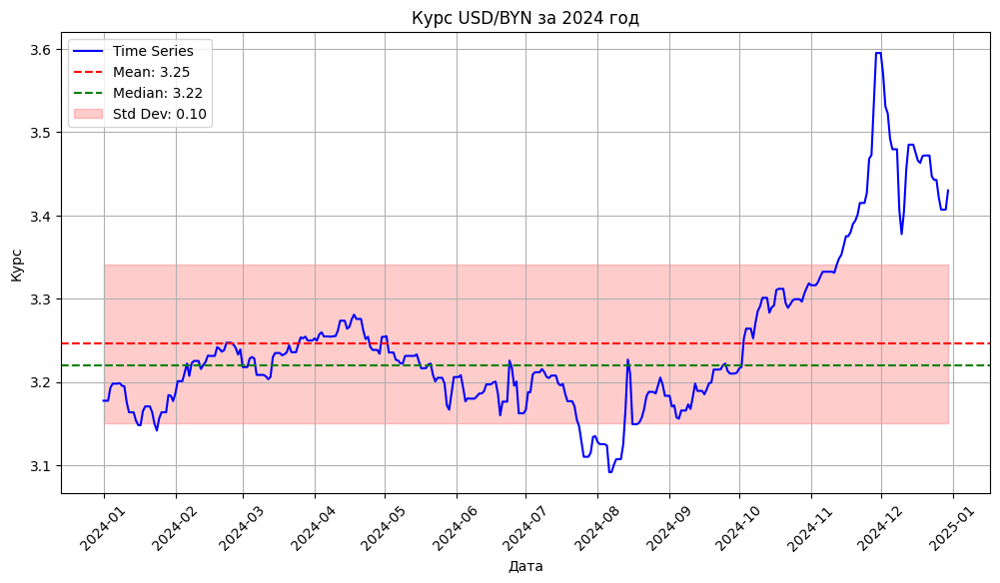

In [ ]:
# Построение графика
plt.figure(figsize=(12, 6))
sns.lineplot(x=usd.index, y=usd['usd'], label="Time Series", color="blue")
plt.axhline(mean_value, color="red", linestyle="--", label=f"Mean: {mean_value:.2f}")
plt.axhline(median_value, color="green", linestyle="--", label=f"Median: {median_value:.2f}")
plt.fill_between(usd.index, mean_value - std_dev, mean_value + std_dev, color='red', alpha=0.2, label=f"Std Dev: {std_dev:.2f}")

# Настройка оси X
plt.gca().xaxis.set_major_formatter(plt.matplotlib.dates.DateFormatter('%Y-%m'))
plt.gca().xaxis.set_major_locator(plt.matplotlib.dates.MonthLocator())
plt.xticks(rotation=45)

# Подписи
plt.title("Курс USD/BYN за 2024 год")
plt.xlabel("Дата")
plt.ylabel("Курс")
plt.legend()
plt.grid()
plt.show()

### Евро (EUR)

In [ ]:
# Вычисление статистик
mean_value = eur["eur"].mean()
median_value = eur["eur"].median()
std_dev = eur["eur"].std()
variance = eur["eur"].var()

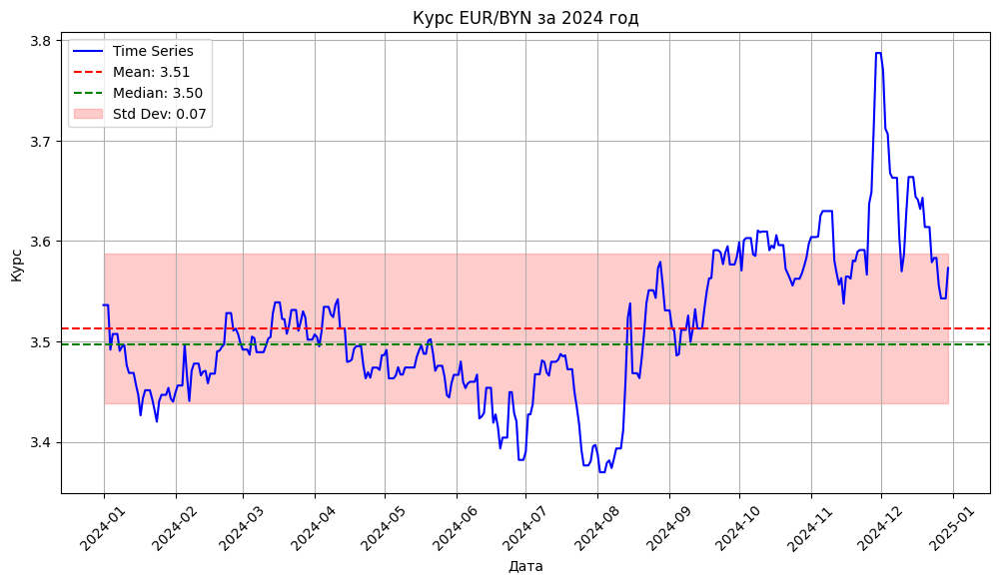

In [ ]:
# Построение графика
plt.figure(figsize=(12, 6))
sns.lineplot(x=eur.index, y=eur['eur'], label="Time Series", color="blue")
plt.axhline(mean_value, color="red", linestyle="--", label=f"Mean: {mean_value:.2f}")
plt.axhline(median_value, color="green", linestyle="--", label=f"Median: {median_value:.2f}")
plt.fill_between(eur.index, mean_value - std_dev, mean_value + std_dev, color='red', alpha=0.2, label=f"Std Dev: {std_dev:.2f}")

# Настройка оси X
plt.gca().xaxis.set_major_formatter(plt.matplotlib.dates.DateFormatter('%Y-%m'))
plt.gca().xaxis.set_major_locator(plt.matplotlib.dates.MonthLocator())
plt.xticks(rotation=45)

# Подписи
plt.title("Курс EUR/BYN за 2024 год")
plt.xlabel("Дата")
plt.ylabel("Курс")
plt.legend()
plt.grid()
plt.show()

## 1. Отображение показателей при помощи `plotly`

In [ ]:
# Параметры скользящего окна
window = 7

# Скользящие параметры
roll_mean = usd["usd"].rolling(window=window).mean()
roll_std  = usd["usd"].rolling(window=window).std()

# Создаем подграфики
fig = make_subplots(rows=2, cols=1, shared_xaxes=True,
                    subplot_titles=("Исходный ряд и скользящее среднее", "Скользящее стандартное отклонение"),
                    vertical_spacing=0.15,
                    specs=[[{"type": "xy"}], [{"type": "xy"}]])

# Первый график: исходный ряд и скользящее среднее
fig.add_trace(go.Scatter(x=usd.index, y=usd['usd'], mode="lines", name="Исходный ряд", line=dict(color="blue", width=1)), row=1, col=1)
fig.add_trace(go.Scatter(x=usd.index, y=roll_mean, mode="lines", name="Скользящее среднее", line=dict(color="red", width=2)), row=1, col=1)

# Второй график: скользящее стандартное отклонение
fig.add_trace(go.Scatter(x=usd.index, y=roll_std, mode="lines", name="Скользящее std", line=dict(color="green", width=2)), row=2, col=1)

# Обновление макета
fig.update_layout(height=600, width=800, showlegend=True, title_text="Анализ временного ряда")

# Отображение
fig.show()

# 2. 3D графика в `plotly`

### Пример 3D графики в `plotly`

In [ ]:
# Генерируем данные для примера
x = np.linspace(0, 10, 100)
y = np.sin(x)
z = np.cos(x)

# Создание 3D-графика
fig = go.Figure(data=[go.Scatter3d(
    x=x,
    y=y,
    z=z,
    mode='markers+lines',  # можно изменить на 'lines' или 'markers'
    marker=dict(
        size=5,
        color=x,             # Цвет зависит от оси X
        colorscale='Viridis', # Палитра цветов
        opacity=0.8
    )
)])

# Настройка оформления
fig.update_layout(
    title='3D график ряда данных',
    scene=dict(
        xaxis_title='Ось X',
        yaxis_title='Ось Y',
        zaxis_title='Ось Z'
    ),
    margin=dict(l=0, r=0, b=0, t=40)
)

# Отображение графика
fig.show()

### Задание 1. Построение 3D графика

Построить 3D график - скользящее нормальное распределение:
- по одной оси - время,
- по второй оси - нормальное значения курса,
- по третьей - плотность распределения.

#### Пример графика:

In [ ]:
# Параметры
np.random.seed(0)
time = np.arange(0, 100, 1)  # Временная шкала
course = np.cumsum(np.random.normal(0, 1, size=len(time)))  # Случайный курс
window_size = 10

# Подготовка данных для 3D-графика
x_data, y_data, z_data = [], [], []

for i in range(window_size, len(time)):
    window = course[i - window_size:i]
    mean, std = np.mean(window), np.std(window)
    x_data.extend([time[i]] * 100)
    y_values = np.linspace(mean - 3 * std, mean + 3 * std, 100)
    y_data.extend(y_values)
    z_data.extend(norm.pdf(y_values, mean, std))

# Создание 3D-графика
fig = go.Figure(data=[go.Scatter3d(
    x=x_data,
    y=y_data,
    z=z_data,
    mode='markers',
    marker=dict(size=2, color=z_data, colorscale='Viridis', opacity=0.7)
)])

# Настройка графика
fig.update_layout(
    title='3D График скользящего нормального распределения',
    scene=dict(
        xaxis_title='Время',
        yaxis_title='Значение курса',
        zaxis_title='Плотность распределения'
    ),
    margin=dict(l=0, r=0, b=0, t=40)
)

# Отображение графика
fig.show()


#### 3D график для USD:

In [ ]:
# Параметры
time = usd.index
course = usd['usd']
window_size = 7

# Подготовка данных для 3D-графика
x_data, y_data, z_data = [], [], []

for i in range(window_size, len(time)):
    window = course[i - window_size:i]
    mean, std = np.mean(window), np.std(window)
    x_data.extend([time[i]] * 100)
    y_values = np.linspace(mean - 3 * std, mean + 3 * std, 100)
    y_data.extend(y_values)
    z_data.extend(norm.pdf(y_values, mean, std))

# Создание 3D-графика
fig = go.Figure(data=[go.Scatter3d(
    x=x_data,
    y=y_data,
    z=z_data,
    mode='markers',
    marker=dict(size=2, color=z_data, colorscale='Viridis', opacity=0.7)
)])

# Настройка графика
fig.update_layout(
    title='3D График скользящего нормального распределения',
    scene=dict(
        xaxis_title='Время',
        yaxis_title='Значение курса',
        zaxis_title='Плотность распределения'
    ),
    margin=dict(l=0, r=0, b=0, t=40)
)

# Отображение графика
fig.show()

### Задание 2.

Построить график правдоподобия для каждой точки ряда скользящих средних, правдоподобие оценивается исходя из того, что точки в рамках окна имеют нормальное распределение.

In [ ]:
import numpy as np
import plotly.graph_objects as go
from scipy.stats import norm

# Параметры
np.random.seed(0)
time = np.arange(0, 100, 1)  # Временная шкала
course = np.cumsum(np.random.normal(0, 1, size=len(time)))  # Случайный курс
window_size = 10

# Подготовка данных для 3D-графика
x_data, y_data, z_data = [], [], []
likelihoods = []

for i in range(window_size, len(time)):
    window = course[i - window_size:i]
    mean, std = np.mean(window), np.std(window)
    x_data.extend([time[i]] * 100)
    y_values = np.linspace(mean - 3 * std, mean + 3 * std, 100)
    y_data.extend(y_values)
    pdf_values = norm.pdf(y_values, mean, std)
    pdf_values_normalized = pdf_values / np.max(pdf_values)
    z_data.extend(pdf_values_normalized)

    # Оценка правдоподобия для текущего окна
    likelihood = np.sum(np.log(norm.pdf(window, mean, std)))
    likelihoods.append(likelihood)

# Создание 3D-графика
fig = go.Figure(data=[go.Scatter3d(
    x=x_data,
    y=y_data,
    z=z_data,
    mode='markers',
    marker=dict(size=2, color=z_data, colorscale='Viridis', opacity=0.7)
)])

# Настройка графика
fig.update_layout(
    title='3D График скользящего нормального распределения',
    scene=dict(
        xaxis_title='Время',
        yaxis_title='Значение курса',
        zaxis=dict(title='Плотность распределения', range=[0, 1])
    ),
    margin=dict(l=0, r=0, b=0, t=40)
)

# Отображение графика
fig.show()

# График правдоподобия
fig_likelihood = go.Figure(data=[go.Scatter(
    x=time[window_size:],
    y=likelihoods,
    mode='lines',
    name='Правдоподобие'
)])

fig_likelihood.update_layout(
    title='График правдоподобия для скользящих окон',
    xaxis_title='Время',
    yaxis_title='Логарифм правдоподобия'
)

fig_likelihood.show()

In [ ]:
# Параметры
time = usd.index
course = usd['usd']
window_size = 30

# Подготовка данных для 3D-графика
x_data, y_data, z_data = [], [], []
likelihoods = []
quantile = [] # посчитать для точки в рамках ее квантиль

for i in range(window_size, len(time)):
    window = course[i - window_size:i]
    mean, std = np.mean(window), np.std(window)
    x_data.extend([time[i]] * 100)
    y_values = np.linspace(mean - 3 * std, mean + 3 * std, 100)
    y_data.extend(y_values)
    pdf_values = norm.pdf(y_values, mean, std)
    pdf_values_normalized = pdf_values / np.max(pdf_values)
    z_data.extend(pdf_values_normalized)

    # Оценка правдоподобия для текущего окна
    likelihood = np.sum(np.log(norm.pdf(window, mean, std)))
    likelihoods.append(likelihood)

# Создание 3D-графика
fig = go.Figure(data=[go.Scatter3d(
    x=x_data,
    y=y_data,
    z=z_data,
    mode='markers',
    marker=dict(size=2, color=z_data, colorscale='Viridis', opacity=0.7)
)])

# Настройка графика
fig.update_layout(
    title='3D График скользящего нормального распределения',
    scene=dict(
        xaxis_title='Время',
        yaxis_title='Значение курса',
        zaxis=dict(title='Плотность распределения', range=[0, 1])
    ),
    margin=dict(l=0, r=0, b=0, t=40)
)

# Отображение графика
fig.show()

# График правдоподобия
fig_likelihood = go.Figure(data=[go.Scatter(
    x=time[window_size:],
    y=likelihoods,
    mode='markers',
    name='Правдоподобие'
)])

fig_likelihood.update_layout(
    title='График правдоподобия для скользящих окон',
    xaxis_title='Время',
    yaxis_title='Логарифм правдоподобия'
)

fig_likelihood.show()

# Скользящие параметры
roll_mean = usd["usd"].rolling(window=window_size).mean()
roll_std  = usd["usd"].rolling(window=window_size).std()

# Создаем подграфики
fig = make_subplots(rows=2, cols=1, shared_xaxes=True,
                    subplot_titles=("Исходный ряд и скользящее среднее", "Скользящее стандартное отклонение"),
                    vertical_spacing=0.15,
                    specs=[[{"type": "xy"}], [{"type": "xy"}]])

# Первый график: исходный ряд и скользящее среднее
fig.add_trace(go.Scatter(x=usd.index, y=usd['usd'], mode="lines", name="Исходный ряд", line=dict(color="blue", width=1)), row=1, col=1)
fig.add_trace(go.Scatter(x=usd.index, y=roll_mean, mode="lines", name="Скользящее среднее", line=dict(color="red", width=2)), row=1, col=1)

# Второй график: скользящее стандартное отклонение
fig.add_trace(go.Scatter(x=usd.index, y=roll_std, mode="lines", name="Скользящее std", line=dict(color="green", width=2)), row=2, col=1)

# Обновление макета
fig.update_layout(height=600, width=800, showlegend=True, title_text="Анализ временного ряда")

# Отображение
fig.show()